In [2]:

# Technical analysis of equities is a method used by traders and investors to evaluate securities based on statistical 
# trends, patterns, and historical price movements. Unlike fundamental analysis, which focuses on analyzing a company's 
# financial statements, earnings, and other qualitative factors, technical analysis primarily examines past market data 
# such as price and volume to predict future price movements.

# In this domain, there are many things to focus on, including:
# Support and Resistance Levels
# Moving Averages, 
# Relative Strength Index (RSI), 
# Moving Average Convergence Divergence (MACD)
# Stochastic Oscillators
# Trends and Patterns
# Etc., etc., etc.


In [3]:

from utils import *
import time
import numpy as np
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
from pandas_datareader import data as wb
import yfinance as yf

# current date minus a month
from datetime import datetime
from dateutil.relativedelta import relativedelta
from datetime import datetime, timedelta

tickers = ['NVDA']

# minus 12 months
currentTimeDate = datetime.now() - relativedelta(months=12)
start = currentTimeDate.strftime('%Y-%m-%d')
end = datetime.now().date() + timedelta(days=1)
print(start)
print(end)


start = start
end = end


tickers = tickers
thelen = len(tickers)


i=0
price_data = []
for ticker in tickers:
    data = yf.download(ticker, start=start, end=end)
    print(i)
    i=i+1
    data = data.reset_index()
    prices = data.loc[:,['Date','Adj Close']]
    price_data.append(prices.assign(ticker=ticker)[['ticker', 'Date', 'Adj Close']])
df = pd.concat(price_data)
df.dtypes
print(df.head())
print(df.tail())
df.shape


2023-03-19
2024-03-20
[*********************100%%**********************]  1 of 1 completed
0
  ticker       Date   Adj Close
0   NVDA 2023-03-20  258.916962
1   NVDA 2023-03-21  261.905975
2   NVDA 2023-03-22  264.595154
3   NVDA 2023-03-23  271.822815
4   NVDA 2023-03-24  267.704132
    ticker       Date   Adj Close
247   NVDA 2024-03-13  908.880005
248   NVDA 2024-03-14  879.440002
249   NVDA 2024-03-15  878.369995
250   NVDA 2024-03-18  884.549988
251   NVDA 2024-03-19  857.919922


(252, 3)

In [4]:

# Technical Indicators

num_training_days = int(data.shape[0]*.7)
print('Number of training days: {}. Number of test days: {}.'.format(num_training_days, data.shape[0]-num_training_days))

data = df
data['ma7'] = data['Adj Close'].rolling(window=7).mean()
data['ma21'] = data['Adj Close'].rolling(window=21).mean()


# Create exponential weighted moving average
data['26ema'] = data['Adj Close'].ewm(span=26).mean()
data['12ema'] = data['Adj Close'].ewm(span=12).mean()
data['MACD'] = (data['12ema']-data['26ema'])

# Create Bollinger Bands
data['20sd'] = data['Adj Close'].rolling(window=20).std() 
data['upper_band'] = data['ma21'] + (data['20sd']*2)
data['lower_band'] = data['ma21'] - (data['20sd']*2)

# Create Exponential moving average
data['ema'] = data['Adj Close'].ewm(com=0.5).mean()

# Create Momentum
data['momentum'] = data['Adj Close']-1
data.head()


Number of training days: 176. Number of test days: 76.


,ticker,Date,Adj Close,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
0,NVDA,2023-03-20,258.916962,NaN,NaN,258.916962,258.916962,0.000000,NaN,NaN,NaN,258.916962,257.916962
1,NVDA,2023-03-21,261.905975,NaN,NaN,260.468950,260.536011,0.067061,NaN,NaN,NaN,261.158722,260.905975
2,NVDA,2023-03-22,264.595154,NaN,NaN,261.951455,262.120295,0.168841,NaN,NaN,NaN,263.537790,263.595154
3,NVDA,2023-03-23,271.822815,NaN,NaN,264.711056,265.183002,0.471946,NaN,NaN,NaN,269.130182,270.822815
4,NVDA,2023-03-24,267.704132,NaN,NaN,265.405162,265.867984,0.462821,NaN,NaN,NaN,268.175554,266.704132


In [5]:

# Trade Signals

signalBuy = []
signalSell = []
position = False 

for i in range(len(data)):
    if data['ma7'][i] > data['ma21'][i]:
        if position == False :
            signalBuy.append(data['Adj Close'][i])
            signalSell.append(np.nan)
            position = True
        else:
            signalBuy.append(np.nan)
            signalSell.append(np.nan)
    elif data['ma7'][i] < data['ma21'][i]:
        if position == True:
            signalBuy.append(np.nan)
            signalSell.append(data['Adj Close'][i])
            position = False
        else:
            signalBuy.append(np.nan)
            signalSell.append(np.nan)
    else:
        signalBuy.append(np.nan)
        signalSell.append(np.nan)

data['Buy_Signal_price'] = signalBuy
data['Sell_Signal_price'] = signalSell
data.head()


,ticker,Date,Adj Close,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Buy_Signal_price,Sell_Signal_price
0,NVDA,2023-03-20,258.916962,NaN,NaN,258.916962,258.916962,0.000000,NaN,NaN,NaN,258.916962,257.916962,NaN,NaN
1,NVDA,2023-03-21,261.905975,NaN,NaN,260.468950,260.536011,0.067061,NaN,NaN,NaN,261.158722,260.905975,NaN,NaN
2,NVDA,2023-03-22,264.595154,NaN,NaN,261.951455,262.120295,0.168841,NaN,NaN,NaN,263.537790,263.595154,NaN,NaN
3,NVDA,2023-03-23,271.822815,NaN,NaN,264.711056,265.183002,0.471946,NaN,NaN,NaN,269.130182,270.822815,NaN,NaN
4,NVDA,2023-03-24,267.704132,NaN,NaN,265.405162,265.867984,0.462821,NaN,NaN,NaN,268.175554,266.704132,NaN,NaN


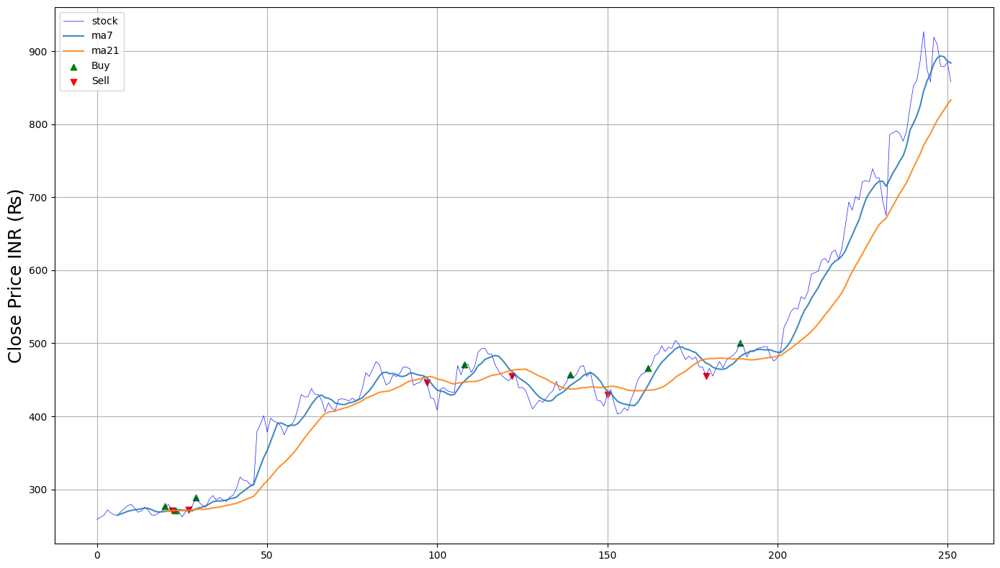

In [6]:


# Plotting Buy and Sell Points

fig, ax = plt.subplots(figsize=(14,8))
ax.plot(data['Adj Close'] , label = 'stock' ,linewidth=0.5, color='blue', alpha = 0.9)
ax.plot(data['ma7'], label = 'ma7', alpha = 0.85)
ax.plot(data['ma21'], label = 'ma21' , alpha = 0.85)
ax.scatter(data.index , data['Buy_Signal_price'] , label = 'Buy' , marker = '^', color = 'green',alpha =1 )
ax.scatter(data.index , data['Sell_Signal_price'] , label = 'Sell' , marker = 'v', color = 'red',alpha =1 )
ax.set_ylabel('Close Price INR (₨)' , fontsize=18)
legend = ax.legend()
ax.grid()
plt.tight_layout()
plt.show()


Std on daily returns  : 0.0286
Mean on daily returns : 0.0048 

     Adj Close        ma20  daily returns  position
0   258.916962         NaN            NaN         0
1   261.905975         NaN       0.011478         0
2   264.595154         NaN       0.010215         0
3   271.822815         NaN       0.026950         0
4   267.704132         NaN      -0.015268         0
5   265.224915         NaN      -0.009304         0
6   264.015320         NaN      -0.004571         0
7   269.753479         NaN       0.021501         0
8   273.742188         NaN       0.014678         0
9   277.680908         NaN       0.014286         0
10  279.560333         NaN       0.006745         0
11  274.441956         NaN      -0.018478         0
12  268.723846         NaN      -0.021056         0
13  270.283264         NaN       0.005786         0
14  275.701599         NaN       0.019849         0
15  271.602875         NaN      -0.014978         0
16  264.865082         NaN      -0.025120         0


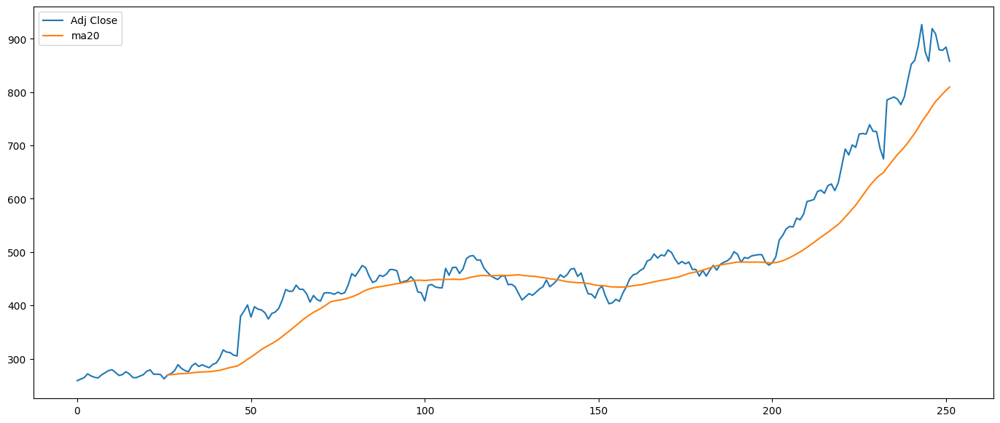

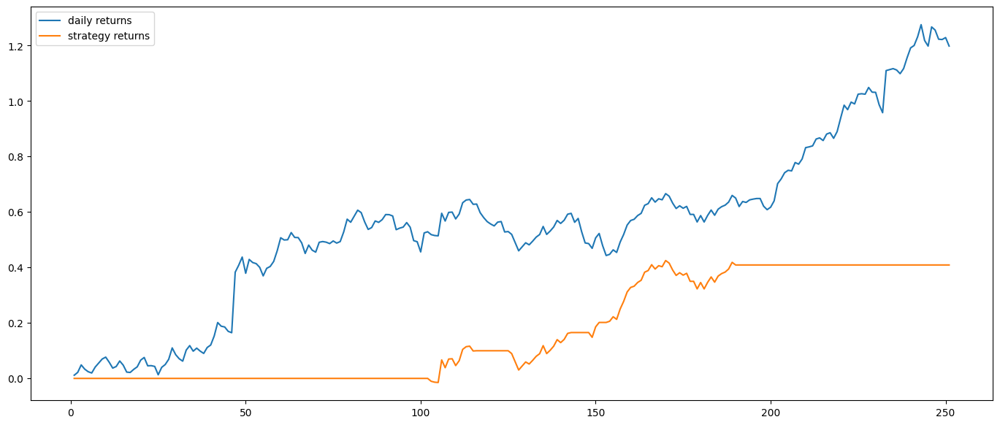

Buy and hold returns = 119.8 %
Strategy returns = 40.89 %


In [7]:

# Mean Reversion Strategy
# For this particular stock, and for the time period analyzed, this particular strategy doesn't do well at all...

moving_average_window = 27

data = df

# readjusting data Frame
data = data[["Adj Close"]]

# creating ** moving average
data["ma20"] = data["Adj Close"].rolling(window=moving_average_window).mean()

#calculating daily returns
data["daily returns"] = np.log(data["Adj Close"] / data["Adj Close"].shift(1))

data["position"] = [0] * len(data)
data.reset_index(inplace=True)
data = data.drop(["index"], axis=1)

pos_exit = False
pos = "N"

std = round(data["daily returns"].std(),4)
mean = round(data["daily returns"].mean(),4)

print("Std on daily returns  :", std)
print("Mean on daily returns :", mean,"\n")

print(data.head(30))


# Event Driven Testing
for i in range(1, len(data)):
    # Signal to go short and reset position
    if pos_exit:
        pos_exit = False
        pos = "N"
        continue

    # going long, if return goes beyond lower bound 
    # (1 standard deviation). The asumption here is 
    # that the stock will revert back to its mean value
    if data["Adj Close"][i] < ((1 - std) * data["ma20"][i]):
        data.at[i, "position"] = 1
        pos = "L"

    # scenario if return in between lower and upper bounds
    if pos == "L":
        data.at[i, "position"] = 1
     
    # updating strategy returns
    data["strategy returns"] = data["daily returns"] * data["position"]

    # exiting if the strategy return drops by 3%
    if data["strategy returns"][i] < -0.03:
        data.at[i, "position"] = 0
        pos_exit = True 

data.tail(10)


# taking positions after one day of signals being generated
data["position"].shift(1)

# plotting
data[["Adj Close","ma20"]].plot(figsize = (17,7))
data[["daily returns", "strategy returns"]].cumsum().\
plot(figsize = (17,7))
plt.show()


print("Buy and hold returns =",round(list(data["daily returns"].cumsum())[-1],4)*100,"%")
print("Strategy returns =", round(list(data["strategy returns"].cumsum())[-1],4)*100,"%")


In [8]:

# Trend-following indicator: Moving Average Crossover
# For this particular stock, and for the time period analyzed, this particular strategy performs quite well!!

data["position"] = np.where(data["Adj Close"] > data["ma20"], 1, -1)


# Volatility-based exit: Trailing Stop-loss
trailing_stop = 0.03  # 3% trailing stop-loss
high_price = data["Adj Close"].rolling(window=moving_average_window).max()
data["trailing_stop_loss"] = high_price * (1 - trailing_stop)
data["exit_signal"] = np.where(data["Adj Close"] < data["trailing_stop_loss"], -1, 0)
data["position"] += data["exit_signal"]


# Adjusting strategy returns based on positions
data["strategy_returns"] = data["daily returns"] * data["position"]


# Cumulative strategy returns
strategy_cumulative_returns = data["strategy_returns"].cumsum()


print("Buy and hold returns =", round(data["daily returns"].cumsum().iloc[-1] * 100, 2), "%")
print("Strategy returns =", round(strategy_cumulative_returns.iloc[-1] * 100, 2), "%")


Buy and hold returns = 119.8 %
Strategy returns = 210.28 %


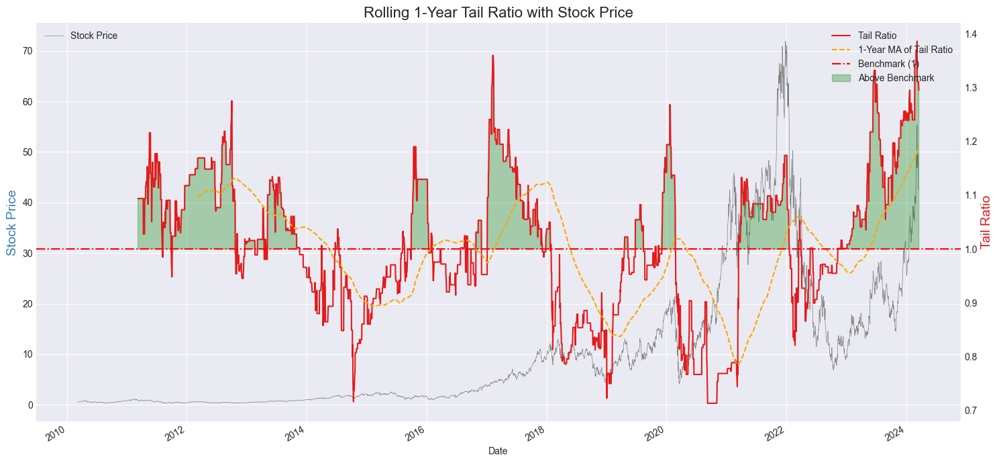

In [9]:

# Let's consider a Moving Average of Tail Ratios...

import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "SOXL"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()
tail_ratio = tickerDf['returns'].rolling(252).apply(lambda x: np.abs(np.percentile(x, 95)) / np.abs(np.percentile(x, 5))).dropna()

# Aesthetics
plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

# Plot stock price
ax1 = plt.gca()
tickerDf['Close'].plot(ax=ax1, color='gray', linewidth=0.5, label='Stock Price')
ax1.set_ylabel('Stock Price', fontsize=14, color=palette(1))
ax1.legend(loc='upper left')

# Plot tail ratio
ax2 = ax1.twinx()
ax2.plot(tail_ratio.index, tail_ratio, color=palette(0), linewidth=1.5, label='Tail Ratio')

# Plotting a simple moving average of the tail ratio
ax2.plot(tail_ratio.index, tail_ratio.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Tail Ratio')

# Horizontal line for benchmark tail ratio of 1
ax2.axhline(y=1, color='red', linestyle='-.', label='Benchmark (1)')

# Shade region where tail ratio is above 1
ax2.fill_between(tail_ratio.index, tail_ratio, 1, where=(tail_ratio > 1), color='green', alpha=0.3, label='Above Benchmark')

# Aesthetics for the tail ratio plot
ax2.set_ylabel('Tail Ratio', fontsize=14, color=palette(0))
ax2.legend(loc='upper right')
plt.title('Rolling 1-Year Tail Ratio with Stock Price', fontsize=16)
ax2.grid(False)  # Turn off grid for the second axis

plt.tight_layout()
plt.show()


In [11]:

# Now, let's shift graes, and instead of focusing one one singlt stock, let's analyze a portfolio of several stocks

df_tickers = ['AXP','AMGN','AAPL','BA','CAT','CSCO','CVX','GS','HD','HON','IBM','INTC','JNJ','KO','JPM','MCD','MMM','MRK','MSFT','NKE','PG','TRV','UNH','CRM','VZ','V','WBA','WMT','DIS','SBUX']

num_items = len(df_tickers)
print(f'{num_items}')


30


In [12]:

import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco
import datetime as dt
import math
from datetime import datetime, timedelta
from pandas_datareader import data as wb
from sklearn.cluster import KMeans
np.random.seed(777)
import yfinance as yf
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
from ta.momentum import RSIIndicator


# current date minus a month
from datetime import datetime
from dateutil.relativedelta import relativedelta
from datetime import datetime, timedelta


# minus 12 months
currentTimeDate = datetime.now() - relativedelta(months=12)
start = currentTimeDate.strftime('%Y-%m-%d')
end = datetime.now().date() + timedelta(days=1)
print(start)
print(end)


start = start
end = end


tickers = df_tickers
thelen = len(tickers)


i=0
price_data = []
for ticker in tickers:
    data = yf.download(ticker, start=start, end=end)
    print(i)
    i=i+1
    #data = yf.download(ticker, start, end)
    data = data.reset_index()
    prices = data.loc[:,['Date','Adj Close']]
    price_data.append(prices.assign(ticker=ticker)[['ticker', 'Date', 'Adj Close']])
df = pd.concat(price_data)
df.dtypes
print(df.head())
print(df.tail())
df.shape


pd.set_option('display.max_columns', 500)


df = df.set_index('Date')
table = df.pivot(columns='ticker')

# By specifying col[1] in below list comprehension you can select the stock names under multi-level column
table.columns = [col[1] for col in table.columns]
print(table.head())
print(table.tail())


2023-03-19
2024-03-20
[*********************100%%**********************]  1 of 1 completed
0
[*********************100%%**********************]  1 of 1 completed
1
[*********************100%%**********************]  1 of 1 completed
2
[*********************100%%**********************]  1 of 1 completed
3
[*********************100%%**********************]  1 of 1 completed
4
[*********************100%%**********************]  1 of 1 completed
5
[*********************100%%**********************]  1 of 1 completed
6
[*********************100%%**********************]  1 of 1 completed
7
[*********************100%%**********************]  1 of 1 completed
8
[*********************100%%**********************]  1 of 1 completed
9
[*********************100%%**********************]  1 of 1 completed
10
[*********************100%%**********************]  1 of 1 completed
11
[*********************100%%**********************]  1 of 1 completed
12
[*********************100%%**********************]  

In [13]:

# Check if the price today is lower than N-number of months ago...in this case we are looking at 12 months...

table_sorted = table.sort_index()

# Extract prices from N months ago and today
price_n_months_ago = table_sorted.iloc[0]
price_today = table_sorted.iloc[-1]

# Create lists for tickers and prices
tickers_list = price_n_months_ago.index.tolist()
price_n_months_ago_list = price_n_months_ago.values.tolist()
price_today_list = price_today.values.tolist()

# Create a list to track whether the price decreased
price_decrease_list = [price_today_list[i] < price_n_months_ago_list[i] for i in range(len(tickers_list))]

# Create a DataFrame with the required information
data = {
    'Ticker': tickers_list,
    'Price 3 Months Ago': price_n_months_ago_list,
    'Price Today': price_today_list,
    'Price Decrease': price_decrease_list
}
result_df = pd.DataFrame(data)

# # Display the DataFrame
print(result_df)


   Ticker  Price 3 Months Ago  Price Today  Price Decrease
0    AAPL          156.564301   174.660004           False
1    AMGN          227.082581   271.140015           False
2     AXP          156.463196   220.385193           False
3      BA          204.770004   180.264999            True
4     CAT          215.919586   350.565002           False
5     CRM          185.008331   297.135010           False
6    CSCO           49.435215    49.384998            True
7     CVX          148.431229   155.943802           False
8     DIS           93.913925   113.730003           False
9      GS          300.043182   385.239990           False
10     HD          281.781403   376.489990           False
11    HON          185.740997   197.475006           False
12    IBM          120.357590   191.380005           False
13   INTC           28.757839    41.638500           False
14    JNJ          149.298401   156.220001           False
15    JPM          123.609589   192.804993           Fal

Total Returns from 2023-03-20 00:00:00 to 2024-03-19 00:00:00
AAPL    11.558001
AMGN    19.401503
AXP     40.854334
BA     -11.967087
CAT     62.359056
CRM     60.606286
CSCO    -0.101581
CVX      5.061316
DIS     21.100256
GS      28.394849
HD      33.610659
HON      6.317404
IBM     59.009503
INTC    44.790086
JNJ      4.636085
JPM     55.978994
KO       2.481876
MCD      6.451527
MMM      7.346770
MRK     17.750752
MSFT    55.021635
NKE    -17.306027
PG      14.494172
SBUX    -6.085306
TRV     35.127637
UNH      4.237150
V       32.114984
VZ      14.806429
WBA    -33.011564
WMT     31.348155
Name: 2024-03-19 00:00:00, dtype: float64


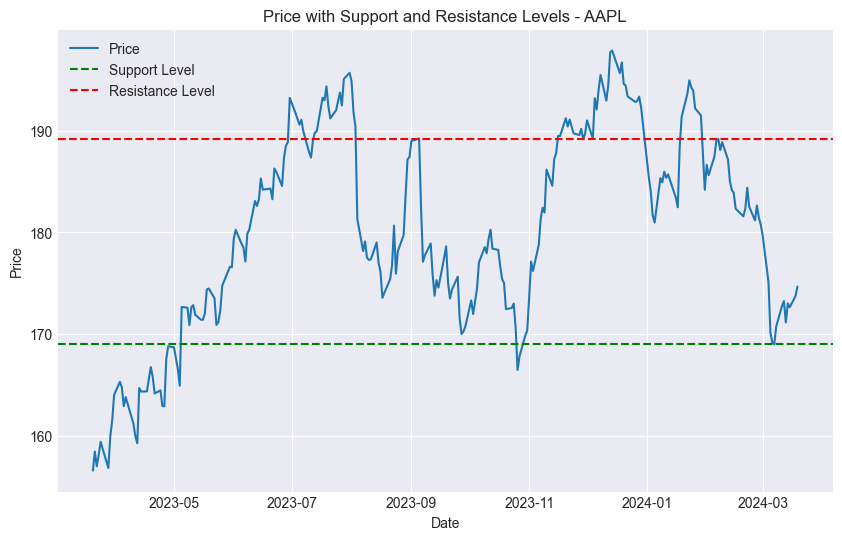

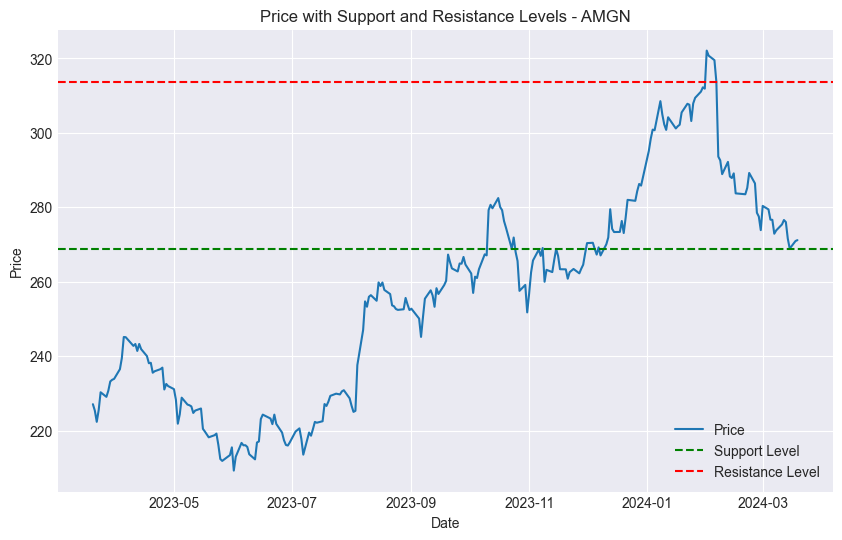

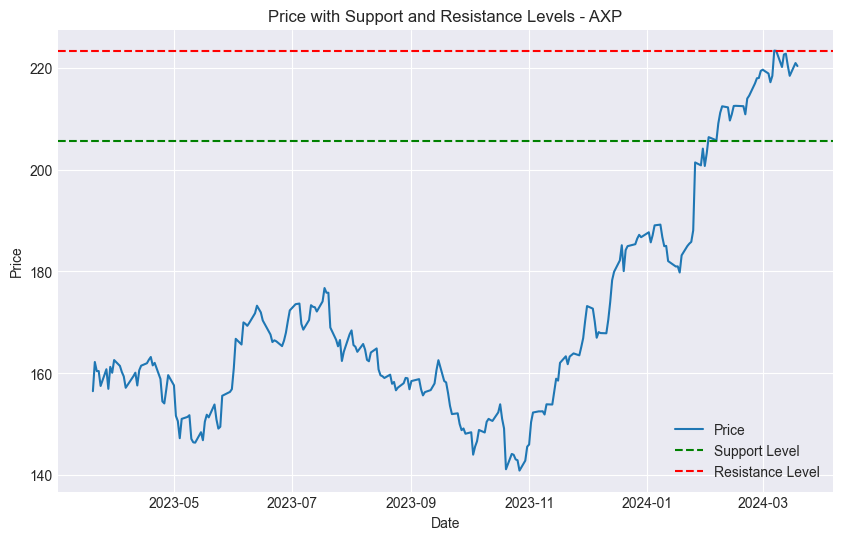

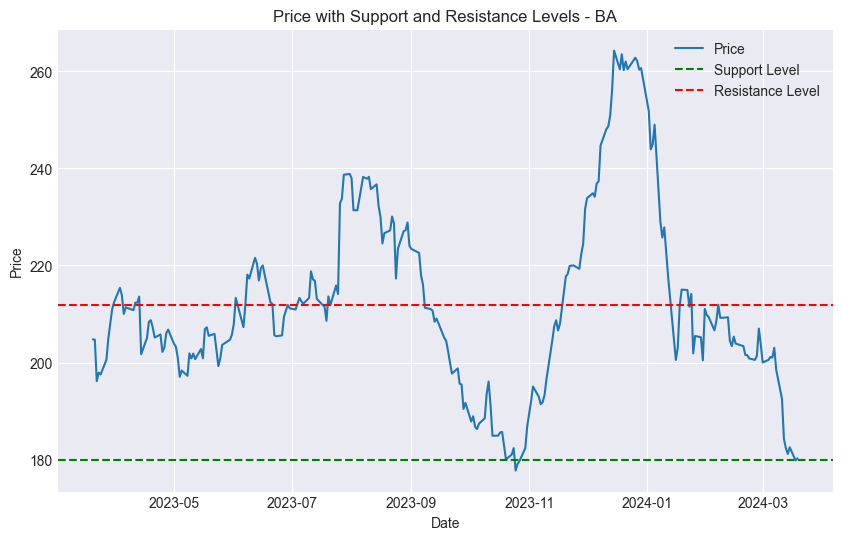

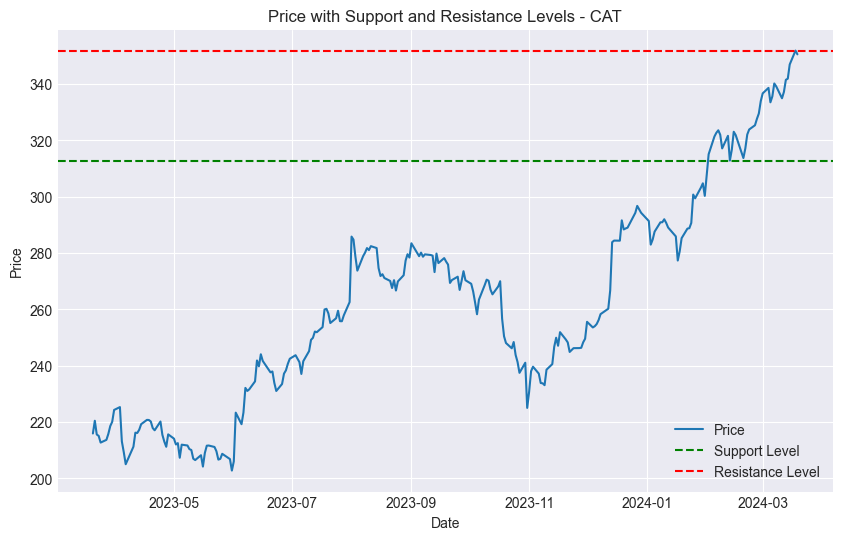

...

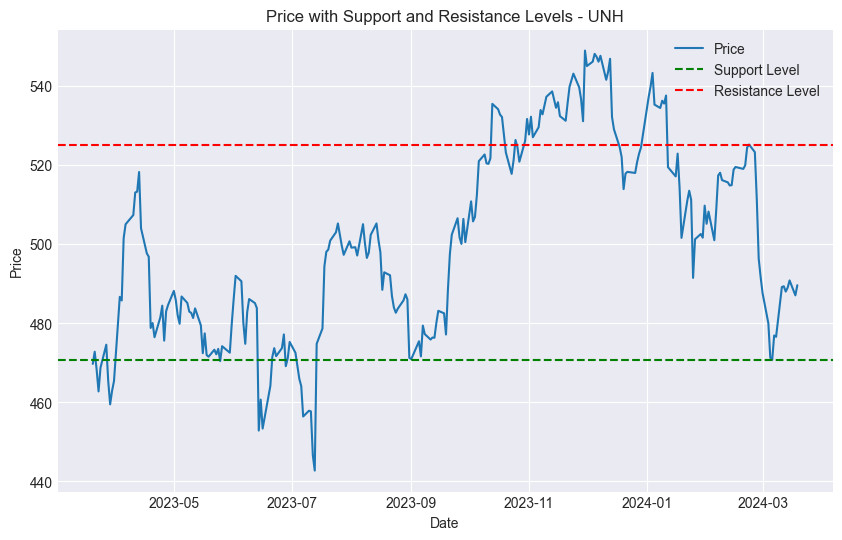

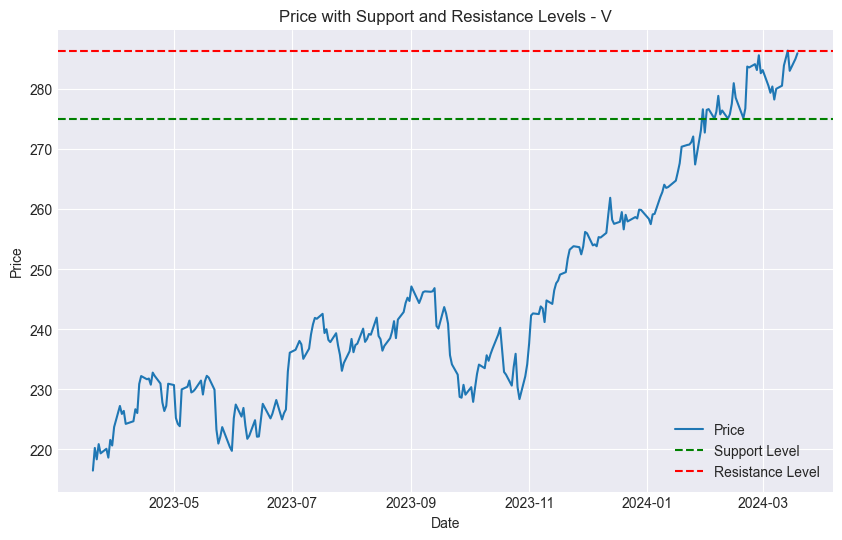

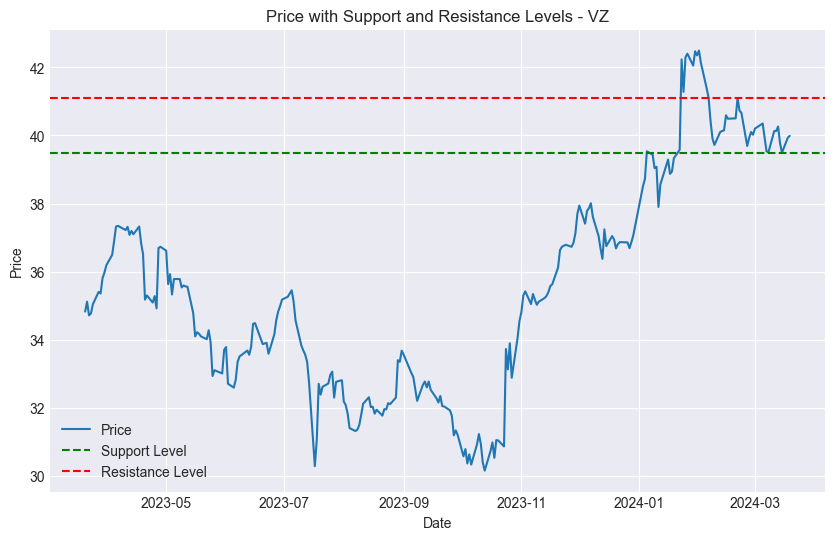

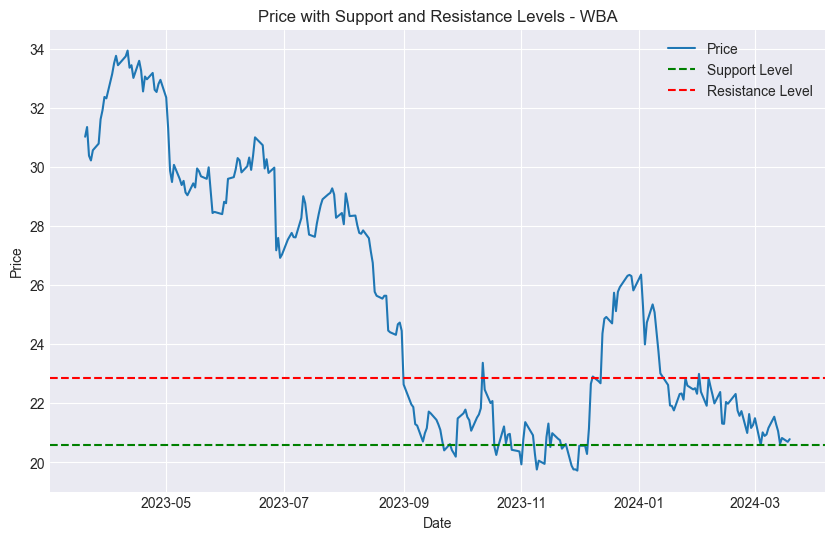

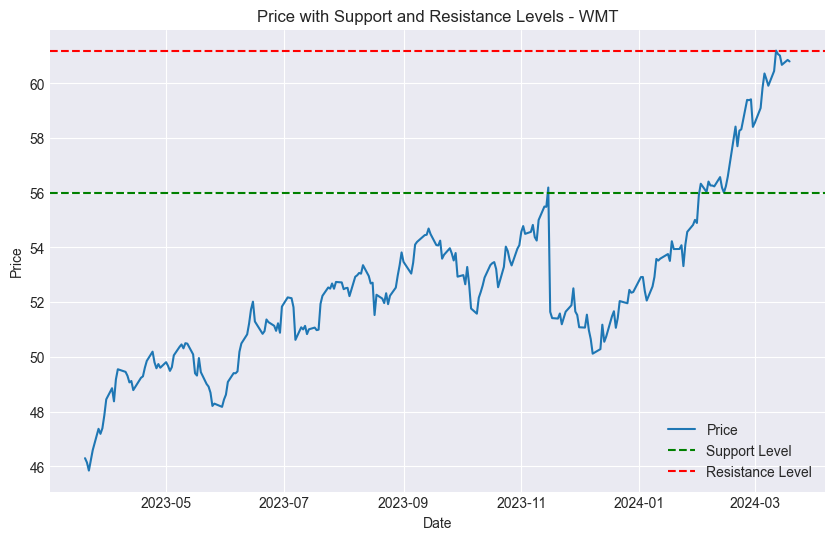

In [14]:

# Find total cumulative returns for the period analyzed

pd.set_option('display.max_rows', None)

# Step 1: Calculate daily returns
returns = table.pct_change()

# Step 2: Calculate cumulative returns
cumulative_returns = (1 + returns).cumprod()

# Step 3: Compute total returns
start_date = cumulative_returns.index[0]
end_date = cumulative_returns.index[-1]

total_returns = (cumulative_returns.iloc[-1] - 1) * 100

# Display total returns
print("Total Returns from", start_date, "to", end_date)
print(total_returns)


# Find Support and Resistance Levels
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your DataFrame has 'Date' as index and 'ticker' as a column
# First, let's pivot the DataFrame to have tickers as columns
pivot_df = df.pivot(columns='ticker', values='Adj Close')

# Define a window size for the rolling minimum and maximum
window_size = 30

# Calculate rolling minimum and maximum for each ticker
rolling_min = pivot_df.rolling(window=window_size, min_periods=1).min()
rolling_max = pivot_df.rolling(window=window_size, min_periods=1).max()

# Iterate through each ticker
for ticker in pivot_df.columns:
    # Extract price data for the current ticker
    price_data = pivot_df[ticker]
    
    # Extract support and resistance levels for the current ticker
    support_level = rolling_min[ticker]
    resistance_level = rolling_max[ticker]

    # Plot the price data
    plt.figure(figsize=(10, 6))
    plt.plot(price_data.index, price_data, label='Price')
    
    # Plot horizontal lines for support and resistance levels
    plt.axhline(y=support_level.iloc[-1], linestyle='--', color='green', label='Support Level')
    plt.axhline(y=resistance_level.iloc[-1], linestyle='--', color='red', label='Resistance Level')
    
    # Set title and labels
    plt.title(f'Price with Support and Resistance Levels - {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    
    # Show the plot
    plt.show()
    

In [15]:

# Assuming you have support and resistance levels calculated for each ticker...

threshold = 0.1  # 10%

# Generate buy signals for stocks trending down and close to the support level
buy_signals = []
sell_signals = []
for ticker in pivot_df.columns:
    price_data = pivot_df[ticker]
    support_level = rolling_min[ticker].iloc[-1]
    resistance_level = rolling_max[ticker].iloc[-1]
    
    # Check if the price is close to the support level and not close to the resistance level
    if (price_data.iloc[-1] <= (1 + threshold) * support_level) and (price_data.iloc[-1] < (1 - threshold) * resistance_level):
        buy_signals.append(ticker)
    
    # Check if the price is close to the resistance level and not close to the support level
    elif (price_data.iloc[-1] >= (1 - threshold) * resistance_level) and (price_data.iloc[-1] > (1 + threshold) * support_level):
        sell_signals.append(ticker)

# Output buy and sell signals
print("Buy signals:", buy_signals)
print("Sell signals:", sell_signals)


Buy signals: ['AMGN', 'BA']
Sell signals: ['CAT', 'DIS', 'JPM', 'MMM']


Index(['AAPL', 'AMGN', 'AXP', 'BA', 'CAT', 'CRM', 'CSCO', 'CVX', 'DIS', 'GS',
       'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'JPM', 'KO', 'MCD', 'MMM', 'MRK',
       'MSFT', 'NKE', 'PG', 'SBUX', 'TRV', 'UNH', 'V', 'VZ', 'WBA', 'WMT'],
      dtype='object', name='ticker')


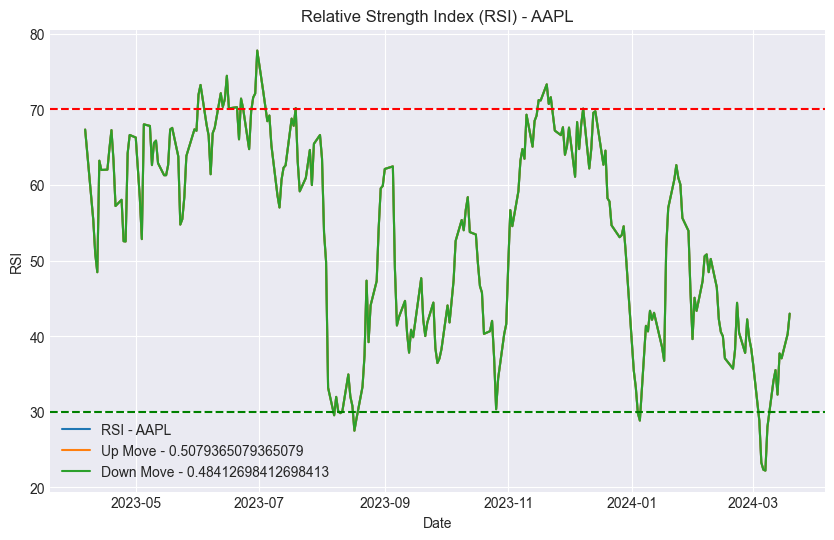

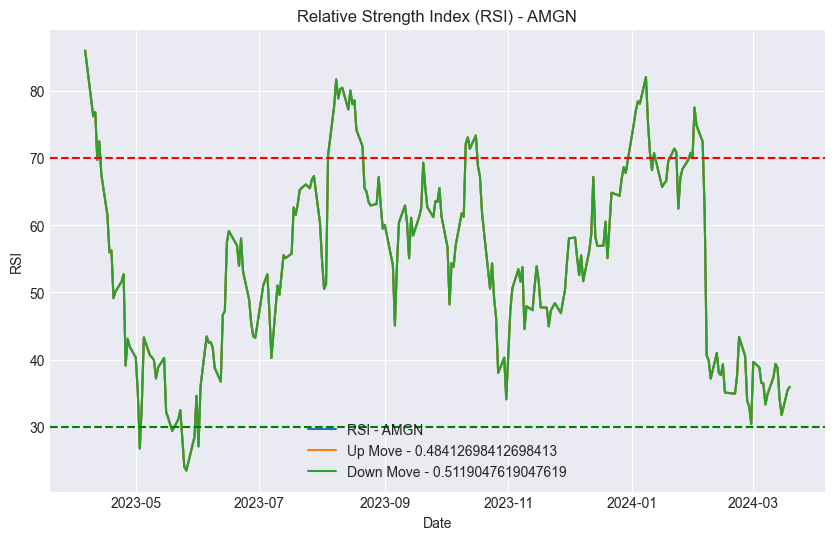

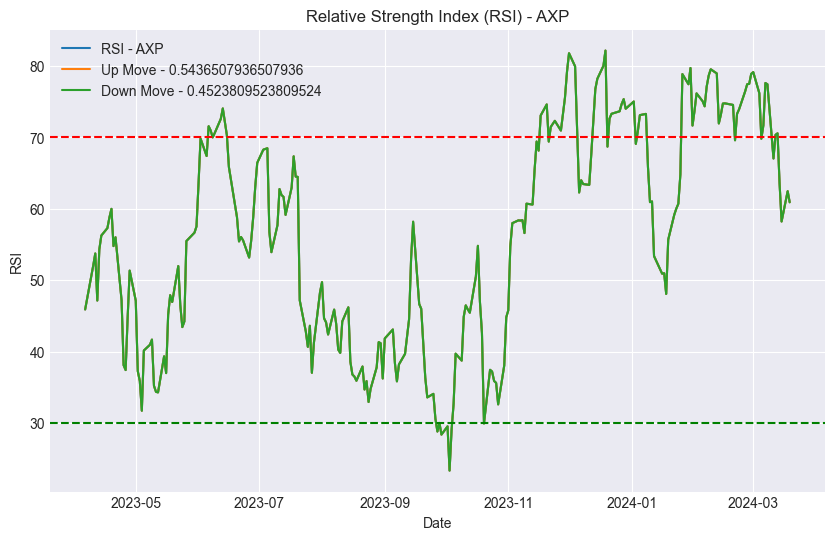

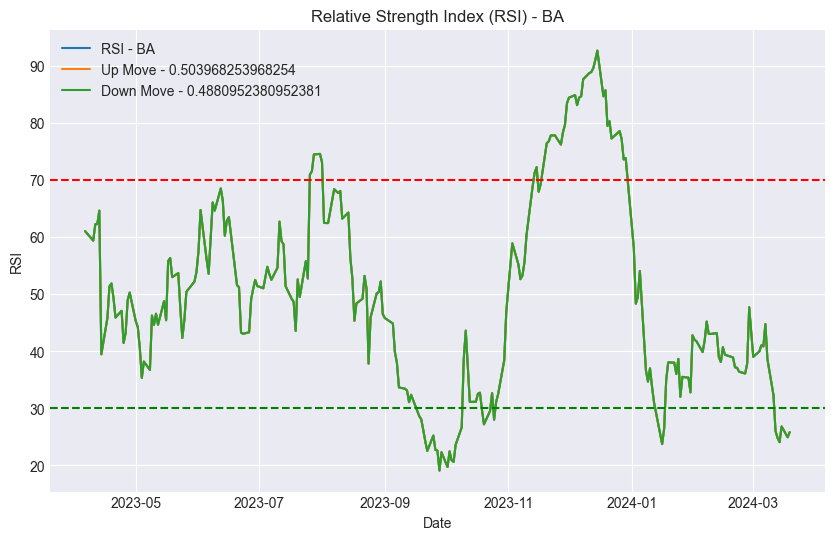

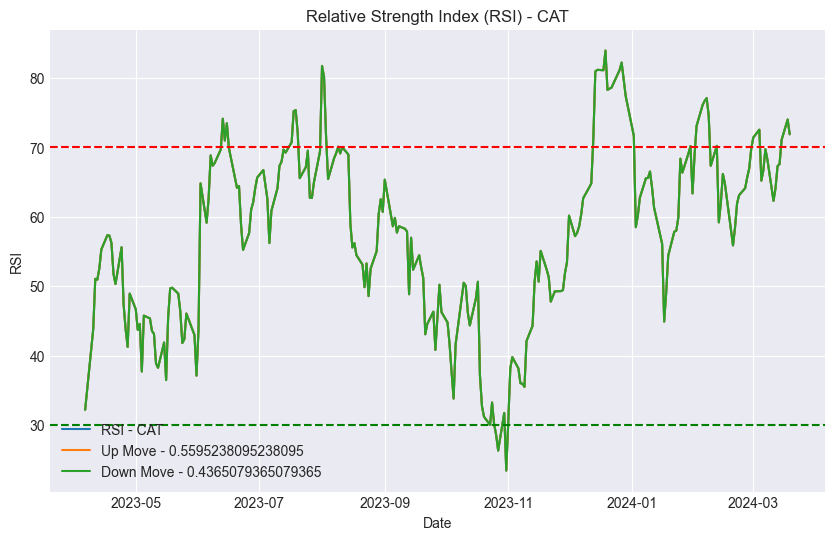

...

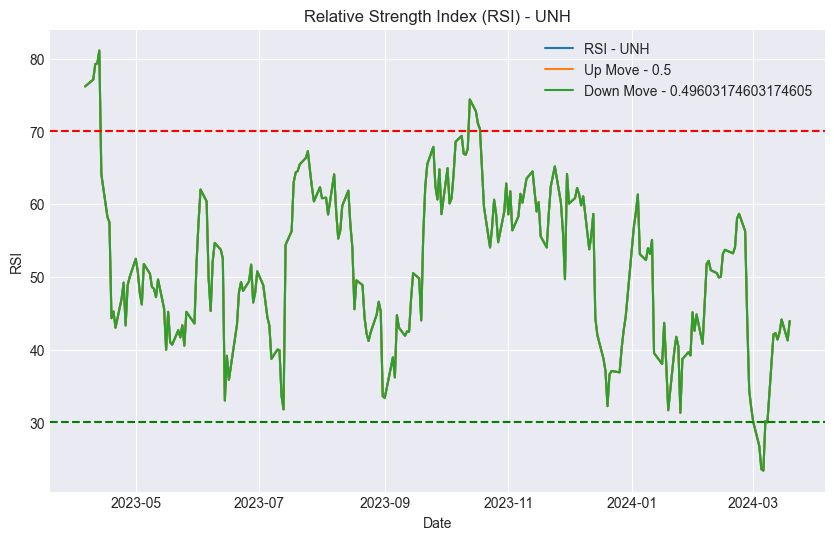

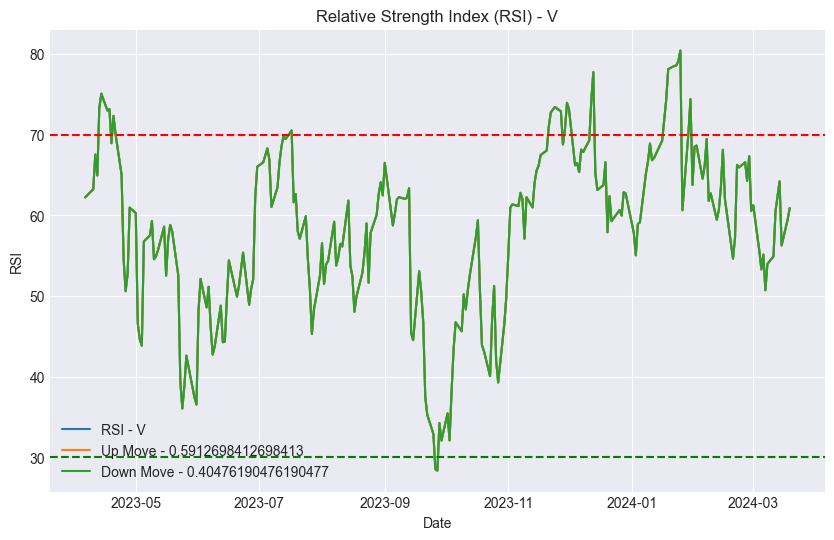

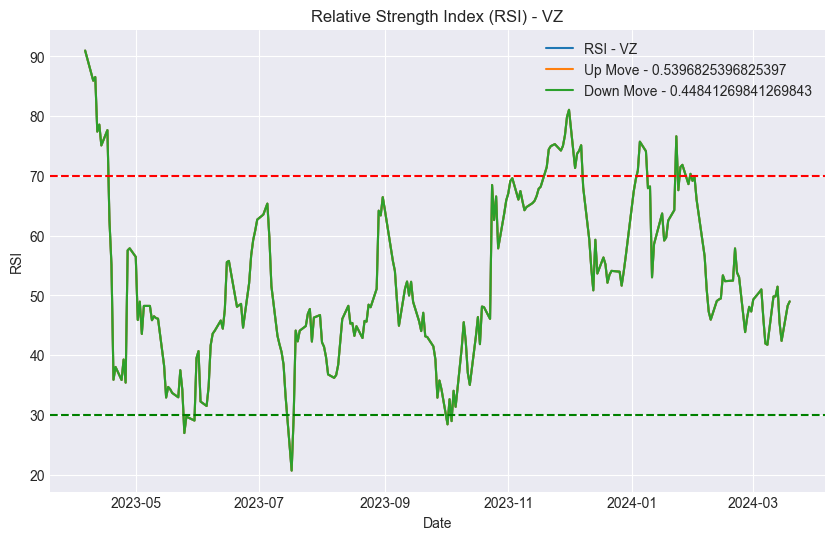

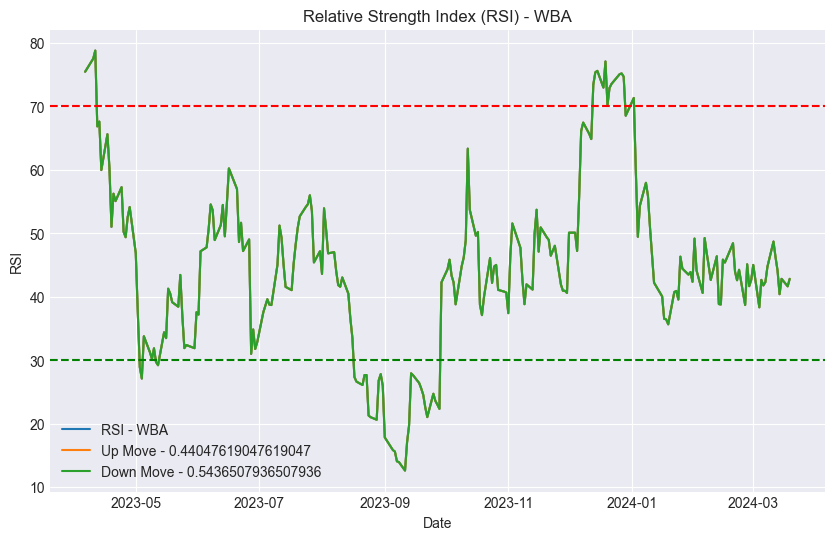

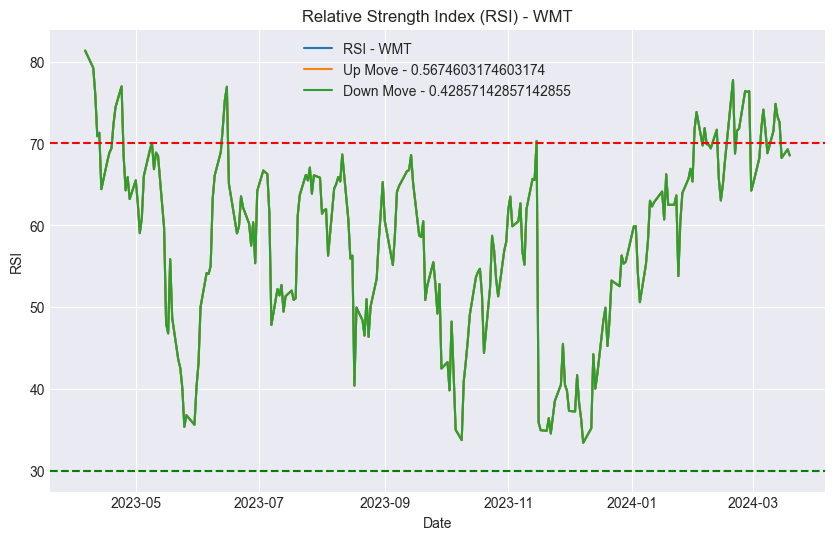

In [16]:

# Plot RSI - Relative Strength index

def calculate_rsi(data, window=14):
    rsi_indicator = RSIIndicator(close=data, window=window)
    rsi = rsi_indicator.rsi()
    return rsi

# Assuming you have a DataFrame with columns as tickers
tickers = pivot_df.columns
print(tickers)

for stock in tickers:
    try:
        # Replace 'my_stock' with the appropriate prefix for your table
        table_name = f'table_{stock}'
        # Assuming you are fetching data from a database using Pandas
        data = pivot_df[stock]
        
        # Calculate RSI
        rsi = calculate_rsi(data)  # Assuming the column containing close prices is named 'Close'
        
        # Assuming 'stock_data' contains the historical price data for your stock
        # Calculate the percentage change in price
        price_change = pivot_df[stock].pct_change()
        
        # Determine whether the price moved up or down
        up_move = price_change > 0
        down_move = price_change < 0
        
        # Calculate the percentage of times the price moved up and down
        probability_up_move = up_move.mean()
        probability_down_move = down_move.mean()
    
        # Plot RSI
        plt.figure(figsize=(10, 6))
        plt.plot(rsi.index, rsi, label=f'RSI - {stock}')
        plt.plot(rsi.index, rsi, label=f'Up Move - {probability_up_move}')
        plt.plot(rsi.index, rsi, label=f'Down Move - {probability_down_move}')
        plt.axhline(y=70, color='r', linestyle='--')
        plt.axhline(y=30, color='g', linestyle='--')
        plt.title(f'Relative Strength Index (RSI) - {stock}')
        plt.xlabel('Date')
        plt.ylabel('RSI')
        plt.legend()
        plt.show()
    except:
        print(stock + ': not working')
        

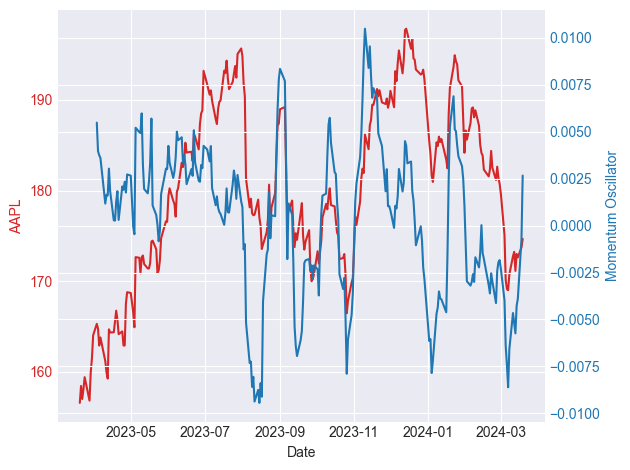

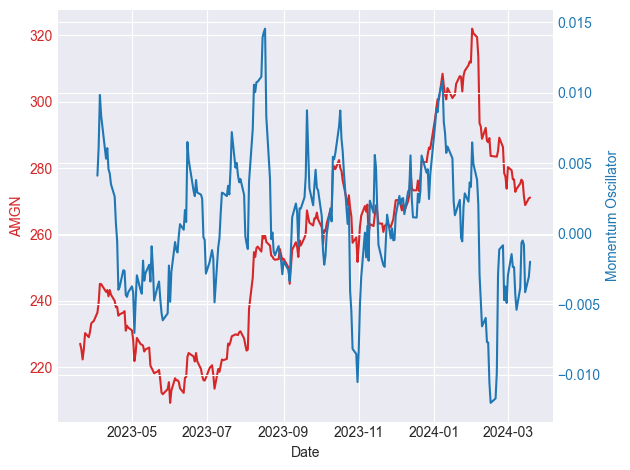

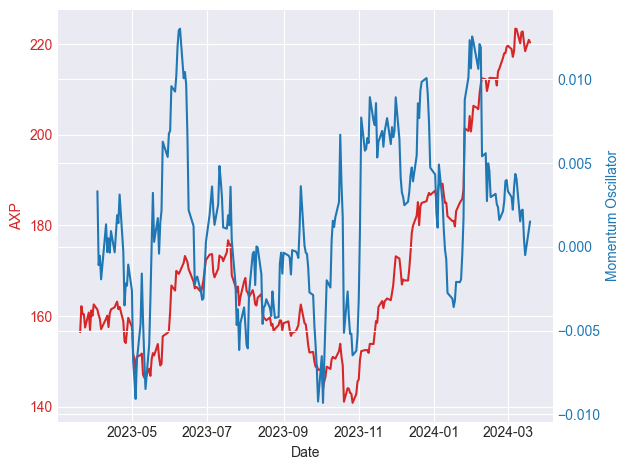

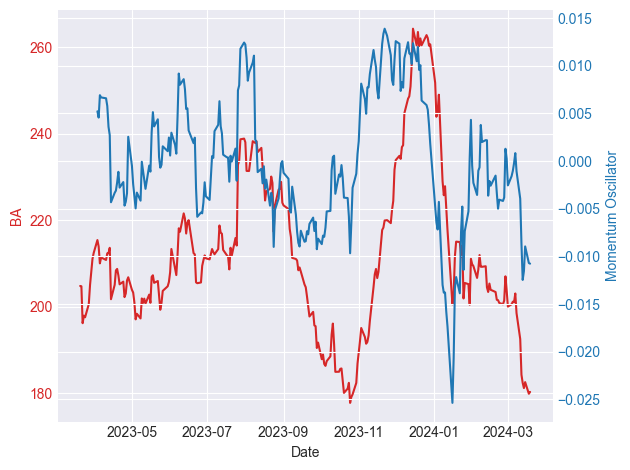

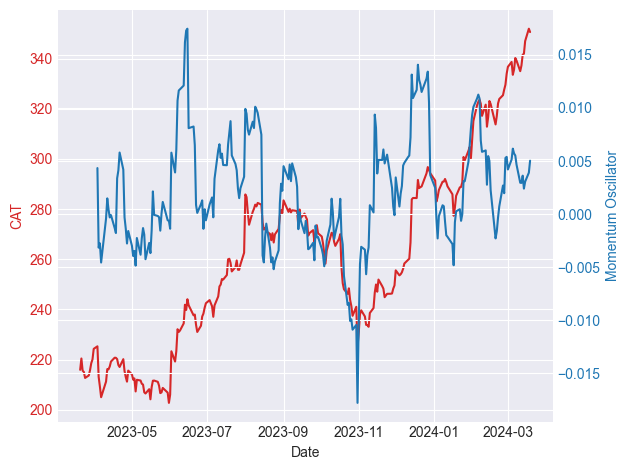

...

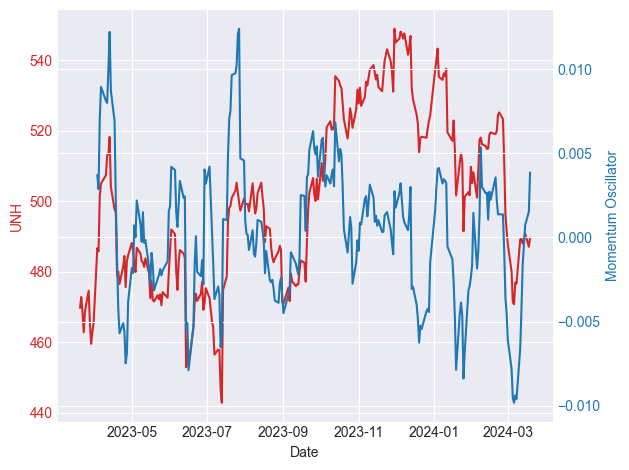

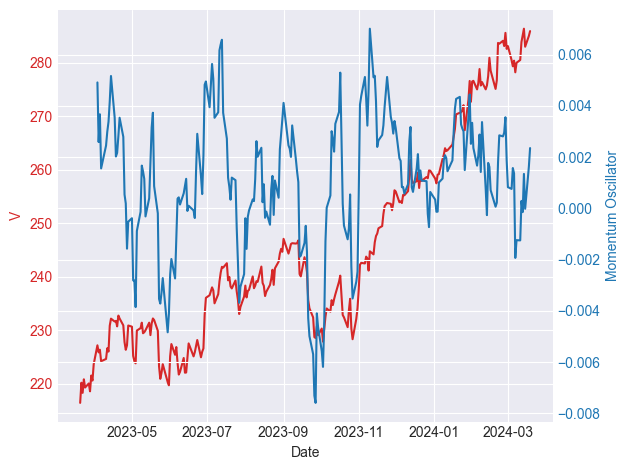

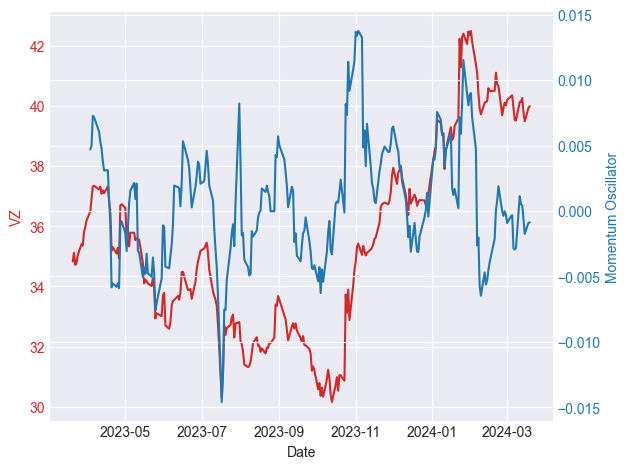

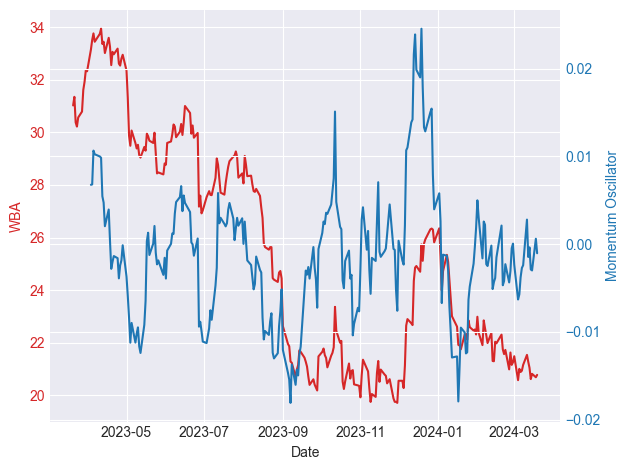

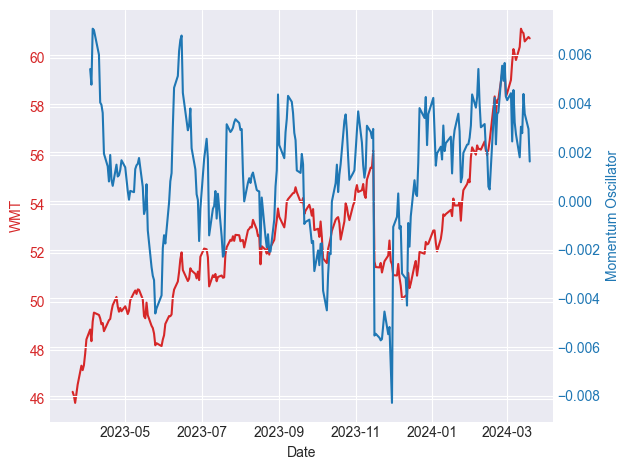

In [17]:

# Momentum Oscillator

for stock in tickers:
    try:
        # Replace 'my_stock' with the appropriate prefix for your table
        table_name = f'table_{stock}'
        # Assuming you are fetching data from a database using Pandas
        data = pivot_df[stock]
        stock_returns = data.pct_change()
        
        # Calculate the Momentum Oscillator for 'stock'
        momentum_oscillator = stock_returns.rolling(window=10).mean()
        
        # Plotting the stock price and the Momentum Oscillator
        fig, ax1 = plt.subplots()
        
        color = 'tab:red'
        ax1.set_xlabel('Date')
        ax1.set_ylabel(stock+'', color=color)
        ax1.plot(data.index, data, color=color)
        ax1.tick_params(axis='y', labelcolor=color)
        
        ax2 = ax1.twinx()
        color = 'tab:blue'
        ax2.set_ylabel('Momentum Oscillator', color=color)
        ax2.plot(momentum_oscillator.index, momentum_oscillator, color=color)
        ax2.tick_params(axis='y', labelcolor=color)
        
        fig.tight_layout()
        plt.show()
    except:
        print(ticker + ': not working')
        

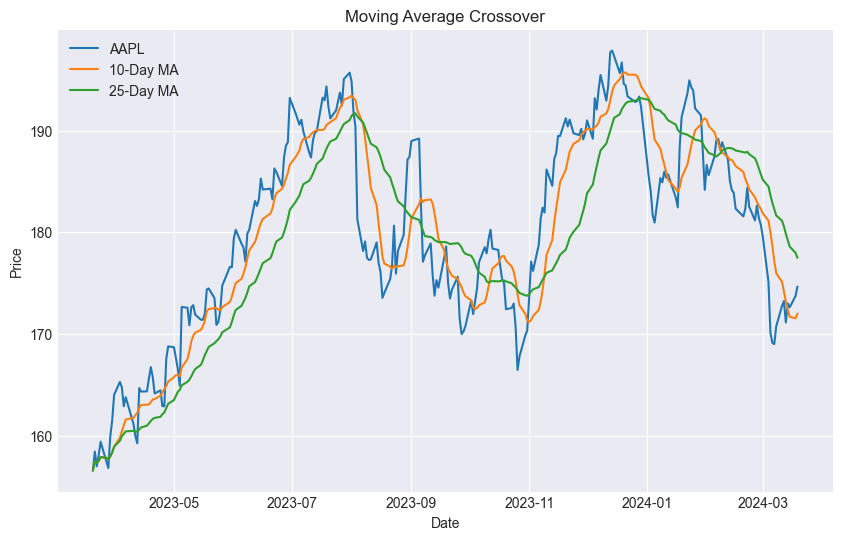

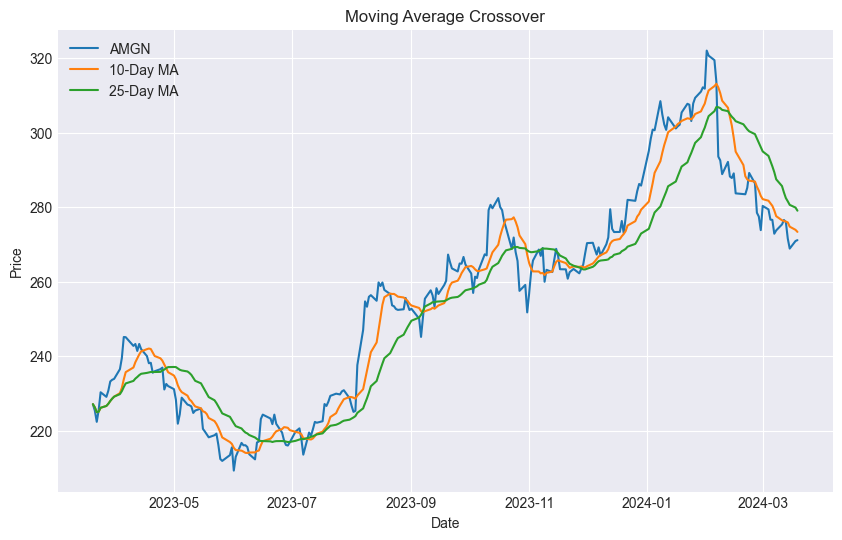

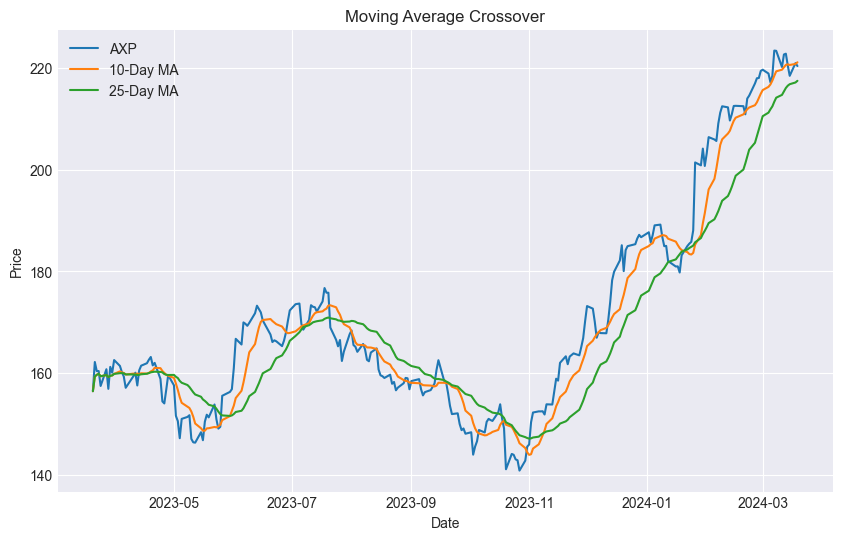

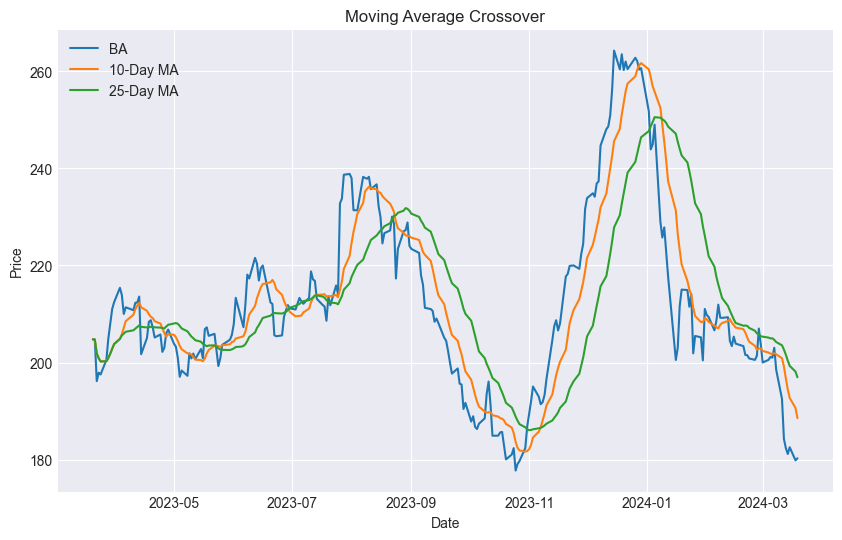

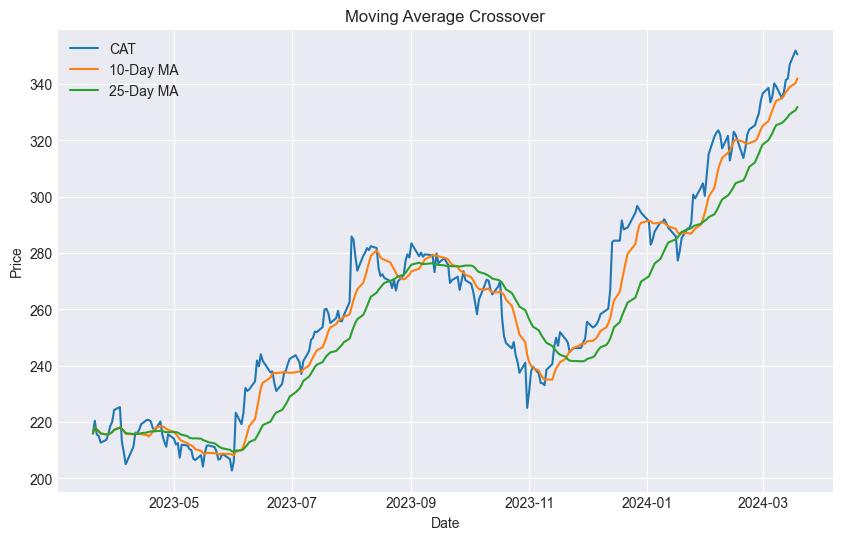

...

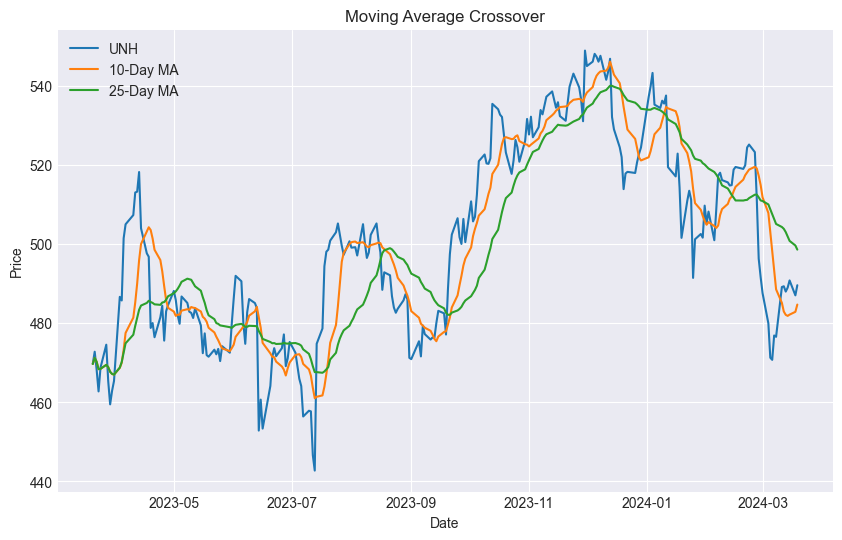

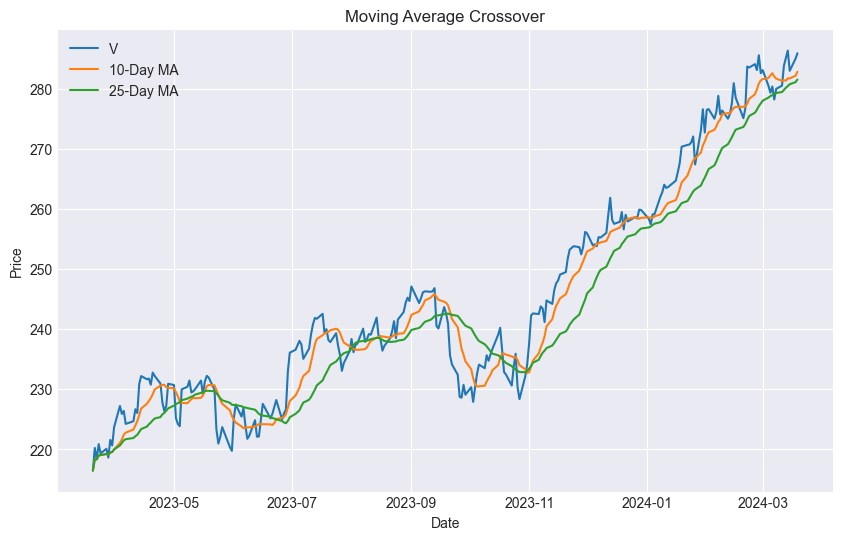

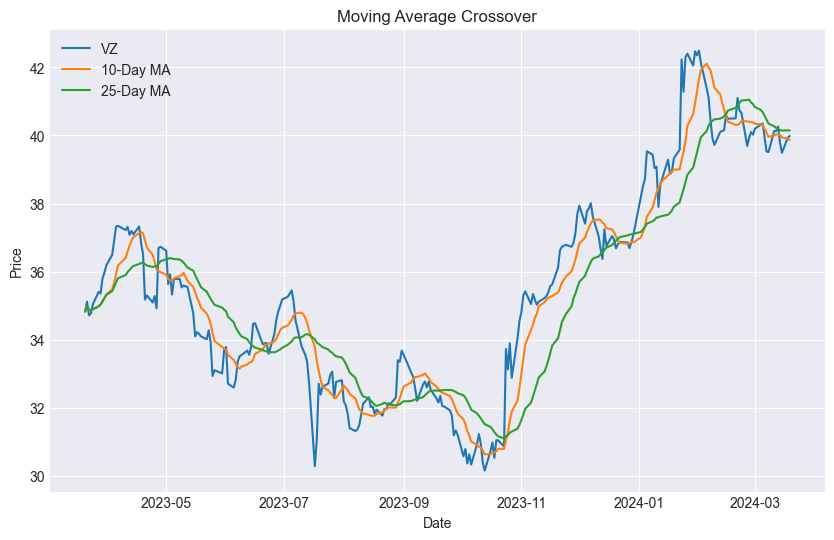

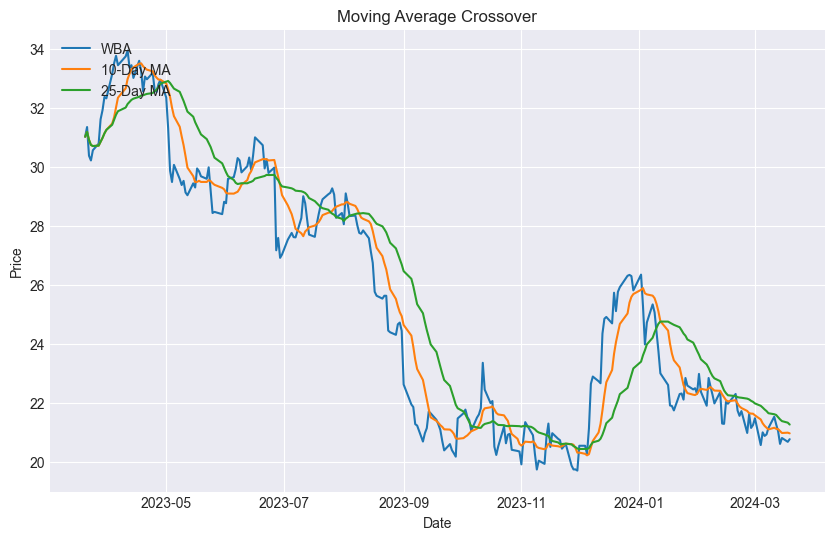

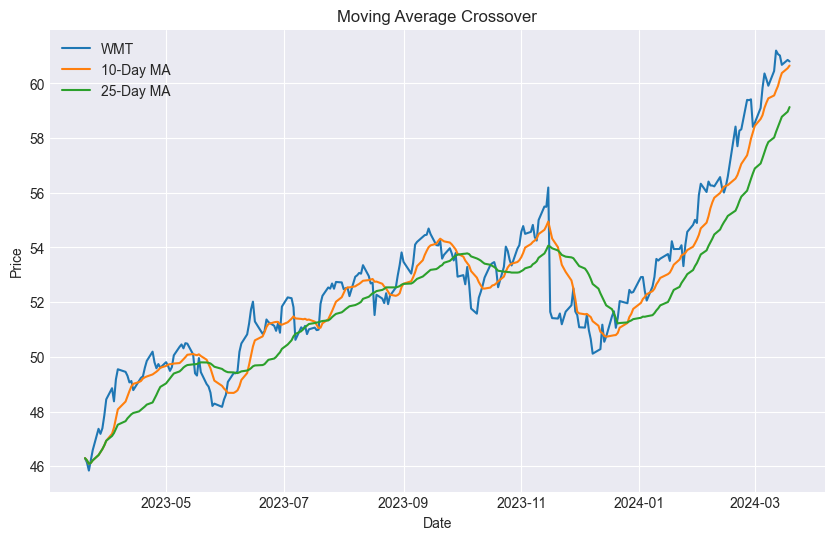

In [18]:

# When RSI is above 70, it indicates that the security may be overbought, suggesting a potential downward reversal or 
# pullback in price.
# Conversely, when RSI is below 30, it suggests that the security may be oversold, signaling a potential upward reversal 
# uptick in price.

for stock in tickers:
    try:
        # Replace 'my_stock' with the appropriate prefix for your table
        table_name = f'table_{stock}'
        # Assuming you are fetching data from a database using Pandas
        data = pivot_df[stock]
        short_window = 10
        long_window = 25
        short_ma = table.rolling(window=short_window, min_periods=1).mean()
        long_ma = table.rolling(window=long_window, min_periods=1).mean()
        
        # Plot moving averages
        plt.figure(figsize=(10, 6))
        plt.plot(table.index, data, label=stock)
        plt.plot(short_ma.index, short_ma[stock], label=f'{short_window}-Day MA')
        plt.plot(long_ma.index, long_ma[stock], label=f'{long_window}-Day MA')
        plt.title('Moving Average Crossover')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='upper left')
        plt.show()
    except:
        print(ticker + ': not working')
        

In [20]:

# K-means clustering can help identify groups of stocks that exhibit similar price movements or fundamental 
# characteristics. By clustering stocks based on their historical price data or financial ratios, investors can 
# build diversified portfolios that spread risk across different clusters. 

# K-Means helps with the following concepts:
# Portfolio Diversification
# Risk Management
# Market Segmentation
# Sector Analysis
# Trading Strategies
# Risk-Adjusted Returns

# Let's do some clustering on our stocks to see what results shake out.

from sklearn.cluster import KMeans
from math import sqrt


# table.columns = table.columns.droplevel(level=0)
# labels = table.columns.tolist()

returns = table.pct_change().mean() * 252
returns = pd.DataFrame(returns)
returns.columns = ['Returns']
returns['Volatility'] = table.pct_change().std() * sqrt(252)
#format the data as a numpy array to feed into the K-Means algorithm
data = np.asarray([np.asarray(returns['Returns']),np.asarray(returns['Volatility'])]).T
X = data


kmeans = KMeans(n_clusters=5).fit(X)
labels = kmeans.predict(X)
centers = kmeans.cluster_centers_
print(centers)


[[ 0.28469533  0.19994646]
 [-0.3401722   0.35165332]
 [ 0.09362082  0.18637038]
 [ 0.48196542  0.25162209]
 [-0.09210477  0.26276721]]


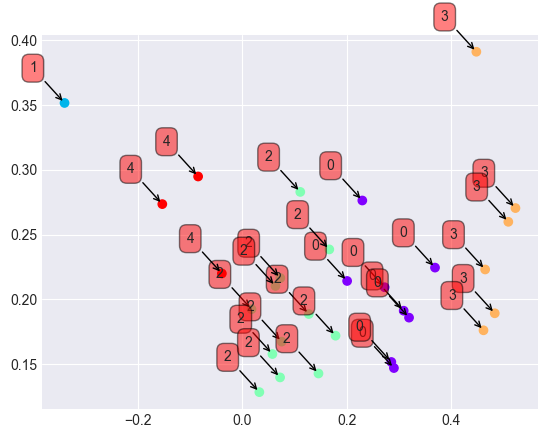

In [21]:

# KMeans with annotations

plt.subplots_adjust(bottom = 0.1)
plt.scatter(data[:, 0], data[:, 1], c=kmeans.labels_, cmap='rainbow') 

for label, x, y in zip(labels, data[:, 0], data[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='red', alpha=0.5),
        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    
plt.show()
    

In [22]:

# List of tickers and cluter IDs

details = [(name,cluster) for name, cluster in zip(returns.index,labels)]
for detail in details:
    print(detail)
    

('AAPL', 2)
('AMGN', 0)
('AXP', 0)
('BA', 4)
('CAT', 3)
('CRM', 3)
('CSCO', 2)
('CVX', 2)
('DIS', 0)
('GS', 0)
('HD', 0)
('HON', 2)
('IBM', 3)
('INTC', 3)
('JNJ', 2)
('JPM', 3)
('KO', 2)
('MCD', 2)
('MMM', 2)
('MRK', 2)
('MSFT', 3)
('NKE', 4)
('PG', 2)
('SBUX', 4)
('TRV', 0)
('UNH', 2)
('V', 0)
('VZ', 2)
('WBA', 1)
('WMT', 0)
